In [1]:
import os
import json
import random
import collections
from glob import glob

import numpy as np
import pandas as pd
import torch


import pycbc
import pycbc.psd
import pylab
from pycbc.psd import welch, interpolate
from pycbc.types import FrequencySeries
from pycbc.types import TimeSeries
from nnAudio.Spectrogram import CQT1992v2

from scipy import signal
# from scipy.fft import fft, fftshift

import joblib
from tqdm import tqdm
import shutil
import line_profiler

import math
import matplotlib.pyplot as plt

In [5]:
data_folder='../../data/'
AVG_W0 = torch.load(data_folder + "avr_w0.pth")
WINDOW = torch.FloatTensor(signal.tukey(4096+2*2048,0.5))
def process_wave(waves, window, avr_w):
    c = torch.FloatTensor(waves)
    c = torch.cat([-c.flip(-1)[:,4096-2049:-1]+2*c[:,0].unsqueeze(-1),c,
                                      -c.flip(-1)[:,1:2049]+2*c[:,-1].unsqueeze(-1)],1)    
    c = torch.fft.ifft(torch.fft.fft((1e20*c*window))/avr_w).real[:,2048:-2048]
    return c.numpy()

Q_TRANSFORM = CQT1992v2(sr=2048, fmin=22, n_bins=64, hop_length=32, output_format='Magnitude', 
             norm=1,bins_per_octave=12,window='nuttall')
def get_image(waves):
    waves = torch.from_numpy(waves)
    image = Q_TRANSFORM(waves).squeeze().numpy()
    return image 

CQT kernels created, time used = 0.0103 seconds


In [6]:
def get_train_file_path(image_id):
    return "{}/train/{}/{}/{}/{}.npy".format(input_data_folder,
        image_id[0], image_id[1], image_id[2], image_id)
def get_test_file_path(image_id):
    return "{}/test/{}/{}/{}/{}.npy".format(input_data_folder,
        image_id[0], image_id[1], image_id[2], image_id)

In [9]:
input_data_folder = data_folder + "/g2net-gravitational-wave-detection"
train_df = pd.read_csv(input_data_folder + '/training_labels.csv')
oof_pred_df = pd.read_csv(data_folder + "/oofs_20210901-130913_CV-0.87749.csv")
train_df = train_df.merge(oof_pred_df[["id","prediction"]],on="id")
train_df["prediction"] = train_df["prediction"].rank(pct=True)
train_df.sort_values("prediction",ascending=False,inplace=True)
train_df["path"] = train_df["id"].apply(get_train_file_path)
train_df

,id,target,prediction,path
382028,aeba158072,1,1.000000,../../data//g2net-gravitational-wave-detection...
1813,00cc4321f9,1,0.999998,../../data//g2net-gravitational-wave-detection...
88489,28377339ba,1,0.999996,../../data//g2net-gravitational-wave-detection...
270891,7c0d3a5cad,1,0.999995,../../data//g2net-gravitational-wave-detection...
550842,fbd00a9171,1,0.999993,../../data//g2net-gravitational-wave-detection...
...,...,...,...,...
147208,4312f53f5e,1,0.000009,../../data//g2net-gravitational-wave-detection...
71703,2096563183,1,0.000007,../../data//g2net-gravitational-wave-detection...
527111,f0f75a5701,1,0.000005,../../data//g2net-gravitational-wave-detection...
354774,a2549225ac,1,0.000004,../../data//g2net-gravitational-wave-detection...


In [10]:
train_pos_df = train_df.query("target == 1").copy()
train_neg_df = train_df.query("target == 0").copy()

In [11]:
test_df = pd.read_csv(input_data_folder + '/sample_submission.csv')
test_df["path"] = test_df["id"].apply(get_test_file_path)
test_df

,id,target,path
0,00005bced6,0.5,../../data//g2net-gravitational-wave-detection...
1,0000806717,0.5,../../data//g2net-gravitational-wave-detection...
2,0000ef4fe1,0.5,../../data//g2net-gravitational-wave-detection...
3,00020de251,0.5,../../data//g2net-gravitational-wave-detection...
4,00024887b5,0.5,../../data//g2net-gravitational-wave-detection...
...,...,...,...
225995,ffff4125f1,0.5,../../data//g2net-gravitational-wave-detection...
225996,ffff9d32a6,0.5,../../data//g2net-gravitational-wave-detection...
225997,ffff9f4c1f,0.5,../../data//g2net-gravitational-wave-detection...
225998,ffffa19693,0.5,../../data//g2net-gravitational-wave-detection...


# Get psd estimation

In [12]:
sites = ["H1","L1","V1"]
def get_psd(wave):
    ts = pycbc.types.TimeSeries(wave, epoch=0, delta_t=1.0/2048)
    ts = ts.highpass_fir(20,8)
    ts = ts.lowpass_fir(950,8)
    delta_t = 1.0/2048
    seg_len = int(1 / delta_t)#1 second
    seg_stride = int(seg_len / 2)#50% overlap
    estimated_psd = interpolate(welch(ts,
                                      seg_len=seg_len,
                                      seg_stride=seg_stride), 1.0 / ts.duration)
    return estimated_psd
    
def gen_avg_psd(df,samples=10000, folder=None):#params tba
    delta_f = 1.0 / 2.0
    flen = int(2048 / delta_f) + 1
    psds = [[],[],[]]
    avg_psd =[]
    len_rows = len(df) if samples is None else samples
    for ii in tqdm(range(len_rows)):#check when it converges
        file_path = df.iloc[ii]["path"]
        idx = df.iloc[ii]["id"]
        target = df.iloc[ii]["target"]
        if os.path.exists(folder + f"/{idx}.npy"):
            continue
        waves = np.load(file_path).astype(np.float32) # (3, 4096)
        tmp_psd = []
        for site in range(3):
            wave = waves[site]
            estimated_psd = get_psd(wave)
            tmp_psd.append(estimated_psd)
            psds[site].append(estimated_psd)
        tmp_psd = np.array(tmp_psd)
        np.save(folder + f"/{idx}", tmp_psd)
        
    plt.figure(figsize=(16,8))
    for site in range(3):
        avg_psd.append(np.mean(psds[site],axis=0))
        plt.loglog(estimated_psd.sample_frequencies, avg_psd[site], label=sites[site])
    plt.legend()
    return avg_psd

In [13]:
if os.path.exists(data_folder + "train_avg_psd.npy"):
    psd_sample = get_psd(np.load(train_df.iloc[0,-1])[0])
    train_avg_psd_np = np.load(data_folder + "train_avg_psd.npy")
    train_avg_psd = []
    plt.figure(figsize=(16,8))
    for i in range(3):
        avg_psd = FrequencySeries(train_avg_psd_np[i],delta_f=psd_sample.delta_f, epoch=0)        
        plt.loglog(psd_sample.sample_frequencies, avg_psd, label=sites[i])        
        train_avg_psd.append(avg_psd)
    plt.legend()
else:
    train_avg_psd = gen_avg_psd(train_df, None, folder=data_folde+"train_psd")
    train_avg_psd = np.array(train_avg_psd)
    np.save(data_folder + "train_avg_psd",train_avg_psd)

FileNotFoundError: [Errno 2] No such file or directory: '../../data//g2net-gravitational-wave-detection/train/a/e/b/aeba158072.npy'

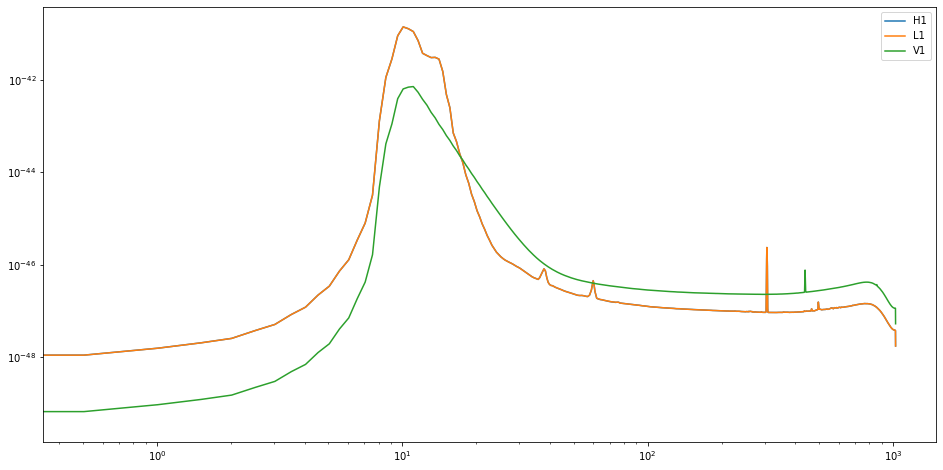

In [15]:
if os.path.exists(data_folder +"test_avg_psd.npy"):
    psd_sample = get_psd(np.load(test_df.iloc[0,-1])[0])
    test_avg_psd_np = np.load(data_folder+"test_avg_psd.npy")
    test_avg_psd = []
    plt.figure(figsize=(16,8))
    for i in range(3):
        avg_psd = FrequencySeries(test_avg_psd_np[i],delta_f=psd_sample.delta_f, epoch=0)        
        plt.loglog(psd_sample.sample_frequencies, avg_psd, label=sites[i])        
        test_avg_psd.append(avg_psd)
    plt.legend()
    plt.show()
else:    
    test_avg_psd = gen_avg_psd(test_df, None, folder =data_folder + "test_psd")
    test_avg_psd = np.array(test_avg_psd)
    np.save("./test_avg_psd",test_avg_psd)

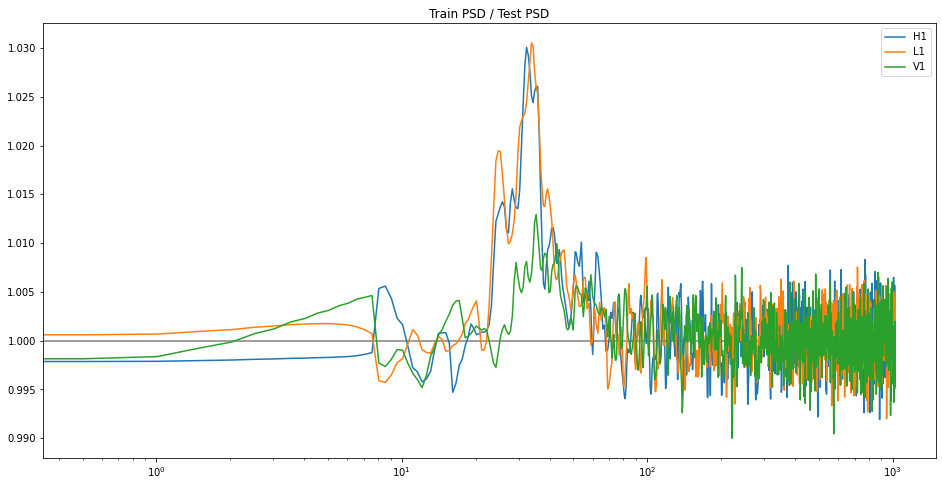

In [16]:
plt.figure(figsize=(16,8))
for site in range(3):
    diff = train_avg_psd[site] / test_avg_psd[site]
    plt.plot(psd_sample.sample_frequencies, diff, label=sites[site])
    plt.xscale('log')
plt.hlines(y=1,xmin=0,xmax=1000,color="black",alpha=0.5)
plt.legend()
plt.title("Train PSD / Test PSD")
plt.show()

# True Positive

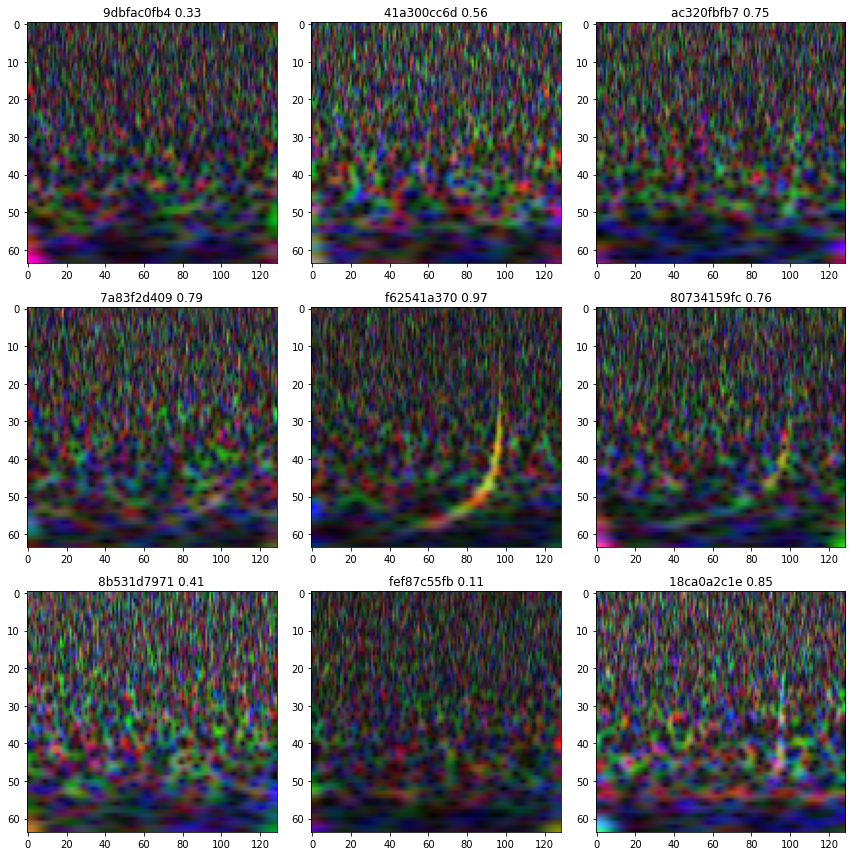

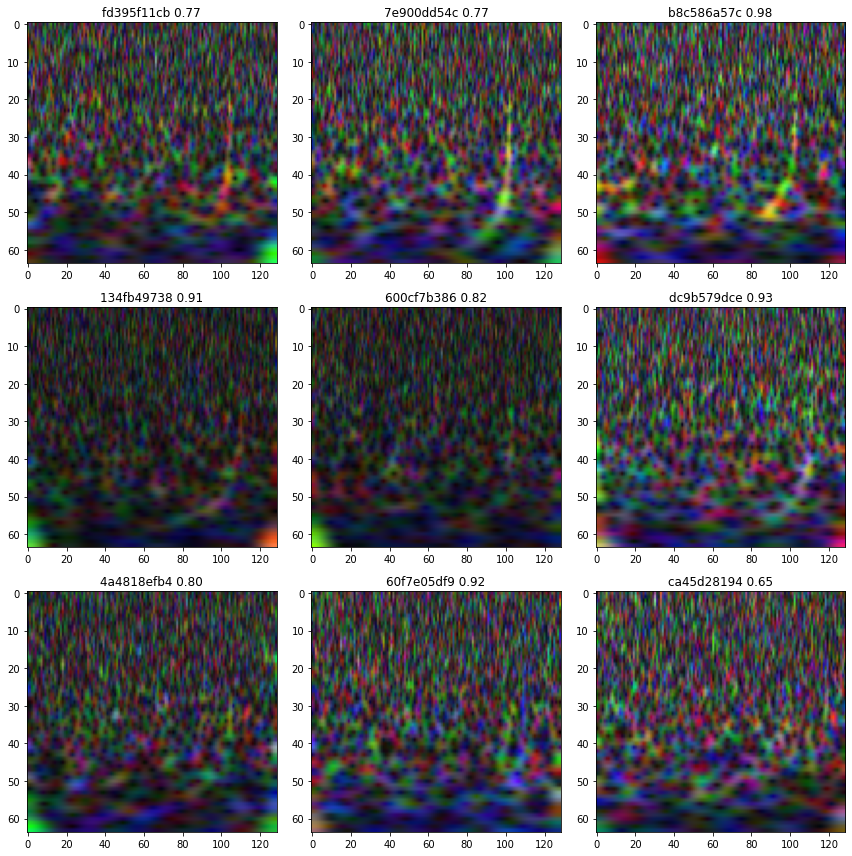

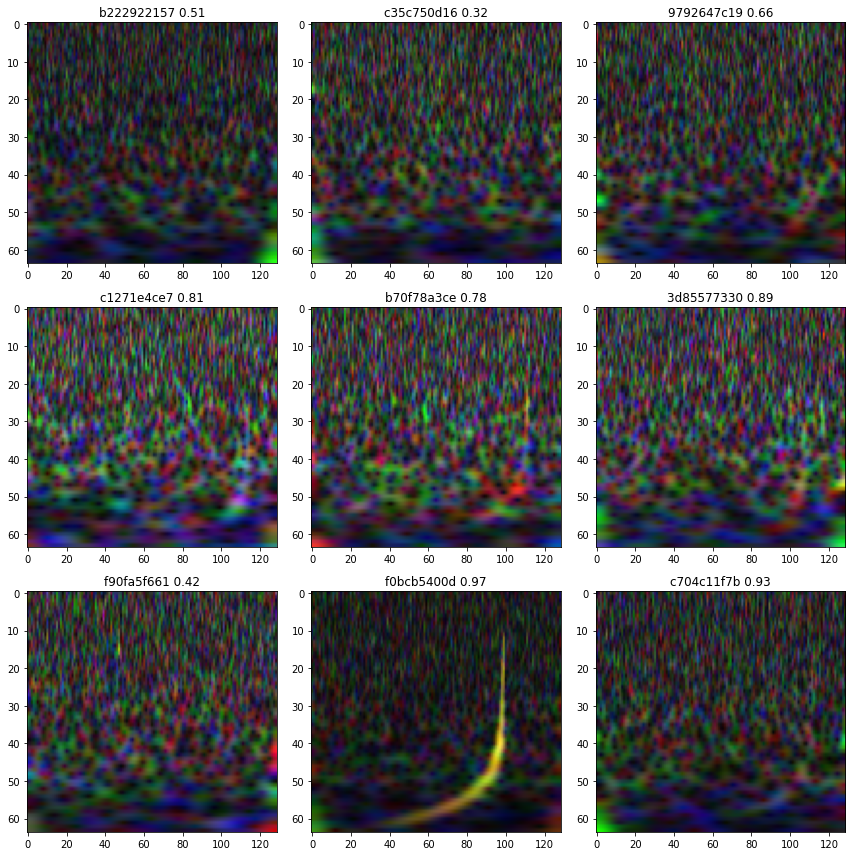

In [145]:
for seed in range(3,6):
    np.random.seed(seed)
    plt.figure(figsize=(12,12))
    for i,idx in enumerate(np.random.choice(range(len(train_pos_df)), size=9, replace=False)):    
        waves = np.load(train_pos_df.iloc[idx,-1])
        idxx = train_pos_df.iloc[idx,0]
        pred_rank = train_pos_df.iloc[idx,-2]
        
        waves_whiten = process_wave(waves, WINDOW, AVG_W)
        waves_whiten_image = get_image(waves_whiten)
        waves_image_norm = waves_whiten_image - waves_whiten_image.min()
        waves_image_norm = waves_image_norm / waves_image_norm.max()

        plt.subplot(3,3,i+1)
        plt.imshow(np.flipud(waves_image_norm.transpose(1,2,0)),aspect='auto')
        plt.title(f"{idxx} {pred_rank:.2f}")
    plt.tight_layout()
    plt.show()

In [146]:
waves_whiten.shape

(3, 4096)

# False Positive

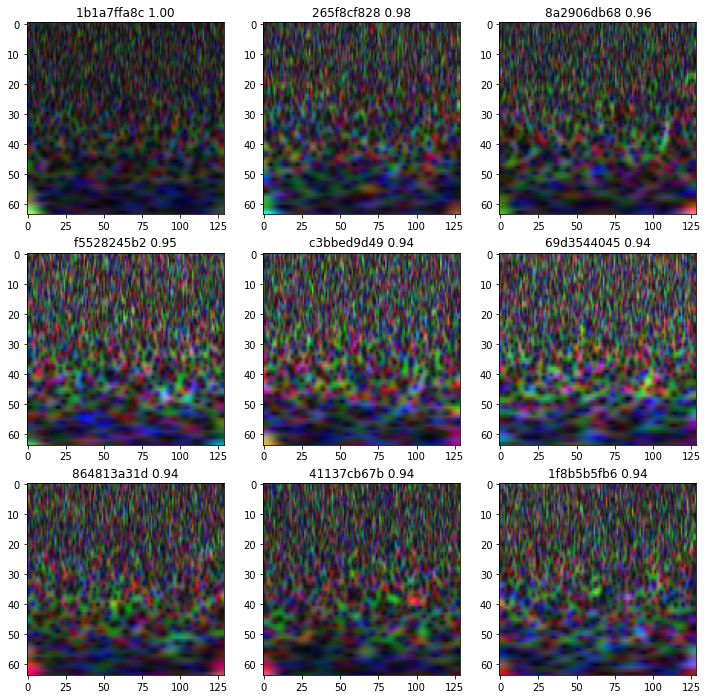

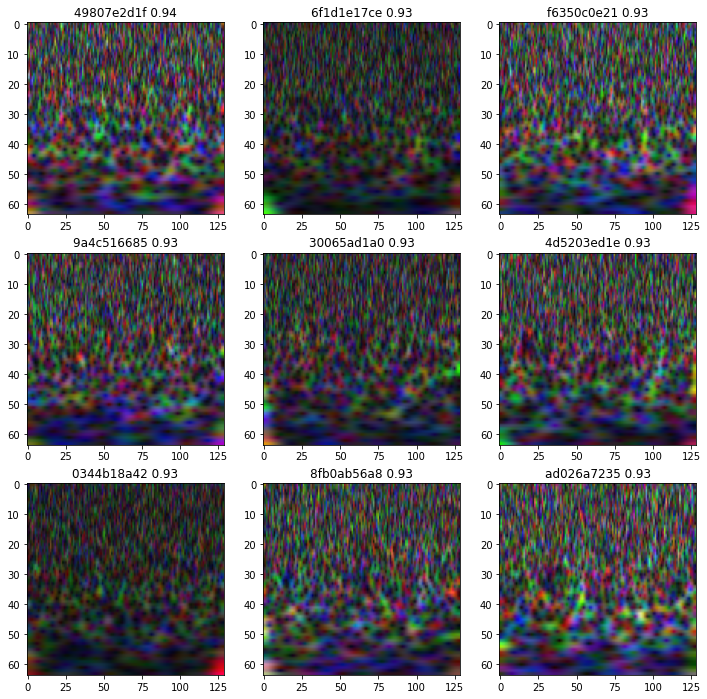

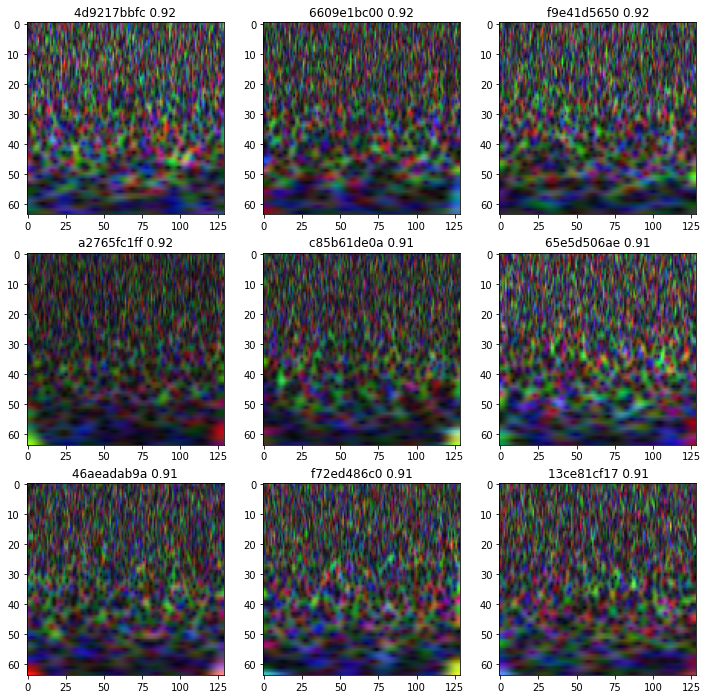

In [18]:
for j in range(3):
    np.random.seed(seed)
    plt.figure(figsize=(12,12))
    for i,idx in enumerate(range(j*9,(j+1)*9)):    
        waves = np.load(train_neg_df.iloc[idx,-1])
        idxx = train_neg_df.iloc[idx,0]
        pred_rank = train_neg_df.iloc[idx,-2]
        waves_whiten = process_wave(waves, WINDOW, AVG_W)
        waves_whiten_image = get_image(waves_whiten)
        waves_image_norm = waves_whiten_image - waves_whiten_image.min()
        waves_image_norm = waves_image_norm / waves_image_norm.max()

        plt.subplot(3,3,i+1)
        plt.imshow(np.flipud(waves_image_norm.transpose(1,2,0)),aspect='auto')
        plt.title(f"{idxx} {pred_rank:.2f}")
    plt.show()

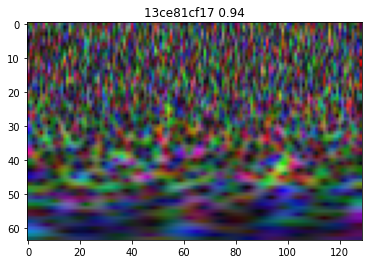

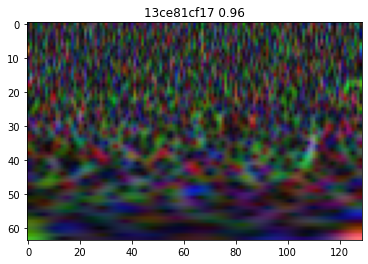

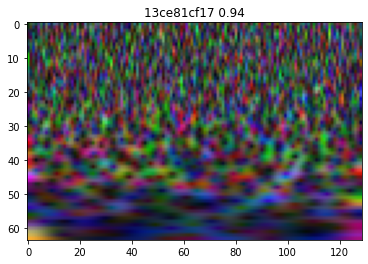

In [19]:
fp_ids = ['69d3544045','8a2906db68','c3bbed9d49']
for idx in fp_ids:
    waves = np.load(train_neg_df.query(f"id == '{idx}'")["path"].iloc[0])
    pred_rank = train_neg_df.query(f"id == '{idx}'")["prediction"].iloc[0]
    
    waves_whiten = process_wave(waves, WINDOW, AVG_W)
    waves_whiten_image = get_image(waves_whiten)
    waves_image_norm = waves_whiten_image - waves_whiten_image.min()
    waves_image_norm = waves_image_norm / waves_image_norm.max()

    plt.imshow(np.flipud(waves_image_norm.transpose(1,2,0)),aspect='auto')
    plt.title(f"{idxx} {pred_rank:.2f}")
    plt.show()
    

# Check PSD of each Group
1. True Positive
2. False Positive
3. True Negative
4. False Negative

In [45]:
def get_top_psds_avg(df, sample=100):
    psds_avg = {}
    for i in tqdm(range(sample)):
        waves = np.load(df.iloc[i,-1])
        for j in range(3):
            psd_sample = get_psd(waves[j])
            if j not in psds_avg:
                psds_avg[j] = psd_sample.data
            else:
                psds_avg[j] += psd_sample.data
    for j in range(3):
        psds_avg[j] /= sample
    return psds_avg

In [46]:
sample=3000
psds_avg_tp = get_top_psds_avg(train_pos_df.sort_values("prediction",ascending=False), sample=sample)
psds_avg_fn = get_top_psds_avg(train_pos_df.sort_values("prediction",ascending=True), sample=sample)
psds_avg_fp = get_top_psds_avg(train_neg_df.sort_values("prediction",ascending=False), sample=sample)
psds_avg_tn = get_top_psds_avg(train_neg_df.sort_values("prediction",ascending=True), sample=sample)

100%|████████████████████████████████████████████████████████████████| 3000/3000 [01:35<00:00, 31.40it/s]


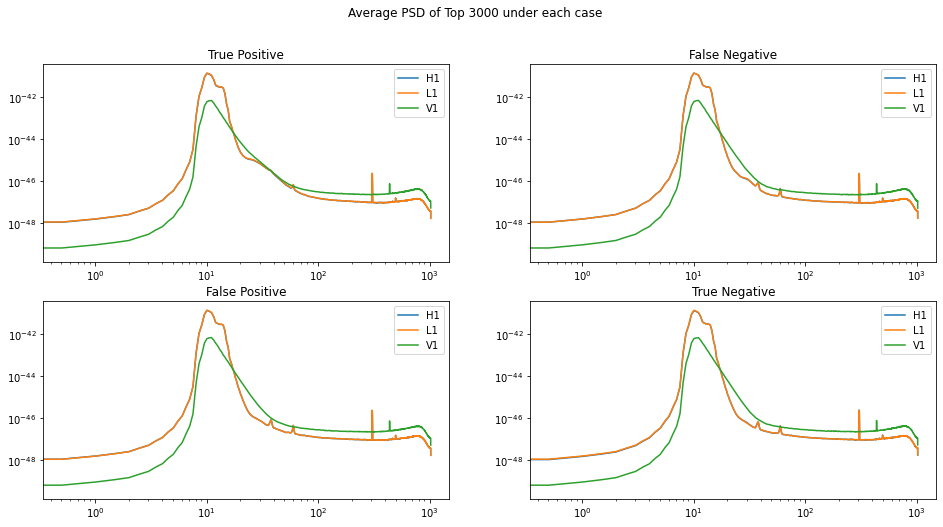

In [53]:
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
for i in range(3):
    avg_psd = FrequencySeries(psds_avg_tp[i],delta_f=psd_sample.delta_f, epoch=0)        
    plt.loglog(psd_sample.sample_frequencies, avg_psd, label=sites[i])       
plt.title("True Positive")
plt.legend()

plt.subplot(2,2,2)
for i in range(3):
    avg_psd = FrequencySeries(psds_avg_fn[i],delta_f=psd_sample.delta_f, epoch=0)        
    plt.loglog(psd_sample.sample_frequencies, avg_psd, label=sites[i])       
plt.title("False Negative")
plt.legend()

plt.subplot(2,2,3)
for i in range(3):
    avg_psd = FrequencySeries(psds_avg_fp[i],delta_f=psd_sample.delta_f, epoch=0)        
    plt.loglog(psd_sample.sample_frequencies, avg_psd, label=sites[i])       
plt.title("False Positive")
plt.legend()

plt.subplot(2,2,4)
for i in range(3):
    avg_psd = FrequencySeries(psds_avg_tn[i],delta_f=psd_sample.delta_f, epoch=0)        
    plt.loglog(psd_sample.sample_frequencies, avg_psd, label=sites[i])       
plt.title("True Negative")
plt.suptitle(f"Average PSD of Top {3000} under each case")
plt.legend()

In [48]:
len(train_pos_df)

279930

In [49]:
sample=20000
psds_avg_t = get_top_psds_avg(train_pos_df.sample(sample), sample=sample)
psds_avg_f = get_top_psds_avg(train_neg_df.sample(sample), sample=sample)

100%|██████████████████████████████████████████████████████████████| 20000/20000 [10:26<00:00, 31.91it/s]


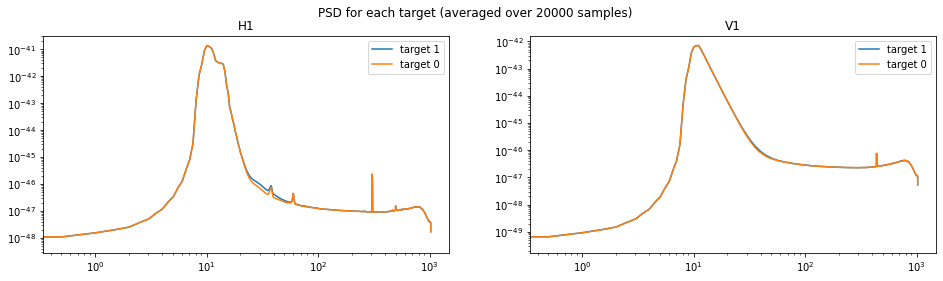

In [54]:
plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
avg_psd = FrequencySeries(psds_avg_t[0],delta_f=psd_sample.delta_f, epoch=0)        
plt.loglog(psd_sample.sample_frequencies, avg_psd, label="target 1")       
avg_psd = FrequencySeries(psds_avg_f[0],delta_f=psd_sample.delta_f, epoch=0)        
plt.loglog(psd_sample.sample_frequencies, avg_psd, label="target 0")       
plt.title("H1")
plt.legend()

plt.subplot(1,2,2)
avg_psd = FrequencySeries(psds_avg_t[2],delta_f=psd_sample.delta_f, epoch=0)        
plt.loglog(psd_sample.sample_frequencies, avg_psd, label="target 1")       
avg_psd = FrequencySeries(psds_avg_f[2],delta_f=psd_sample.delta_f, epoch=0)        
plt.loglog(psd_sample.sample_frequencies, avg_psd, label="target 0")       
plt.title("V1")
plt.legend()

plt.suptitle(f"PSD for each target (averaged over {sample} samples)")
plt.legend()

No handles with labels found to put in legend.


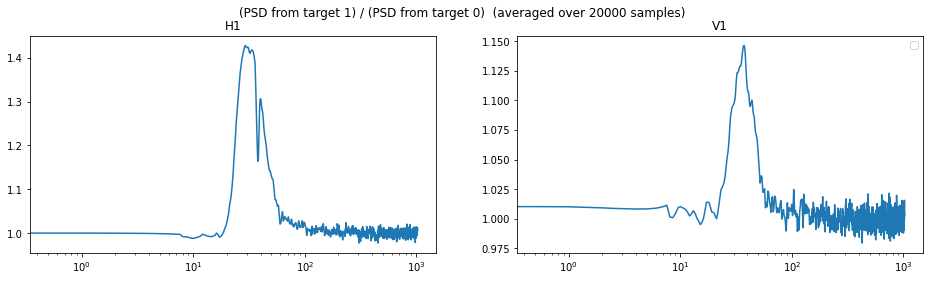

In [55]:
plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
avg_psd_t = FrequencySeries(psds_avg_t[0],delta_f=psd_sample.delta_f, epoch=0)        
avg_psd_f = FrequencySeries(psds_avg_f[0],delta_f=psd_sample.delta_f, epoch=0)        
plt.plot(psd_sample.sample_frequencies, avg_psd_t.data/avg_psd_f.data)       
plt.xscale("log")
plt.title("H1")

plt.subplot(1,2,2)
avg_psd_t = FrequencySeries(psds_avg_t[2],delta_f=psd_sample.delta_f, epoch=0)        
avg_psd_f = FrequencySeries(psds_avg_f[2],delta_f=psd_sample.delta_f, epoch=0)        
plt.plot(psd_sample.sample_frequencies, avg_psd_t.data/avg_psd_f.data)       
plt.xscale("log")
plt.title("V1")

plt.suptitle(f"(PSD from target 1) / (PSD from target 0)  (averaged over {sample} samples)")
plt.legend()

# Curve From Anjum

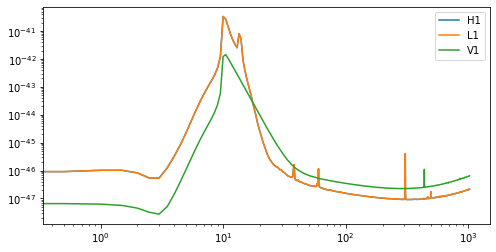

In [83]:
asd_dct = np.load(data_folder + "design_curves_tukey_0.2.npy")
plt.figure(figsize=(8,4))
for i in range(3):
    plt.loglog(sample_freq, asd_dct[i]**2, label=sites[i])
    plt.legend()
plt.show()

In [63]:
def build_design_curves(df, window=("tukey", 0.2)):
    hanford = 0
    livingston = 0
    virgo = 0
    n = len(df)
    window = ("tukey", 0.2)

    for path in tqdm(df["path"]):
        data = np.load(path)
        
        hanford += signal.periodogram(data[0], fs=2048, window=window)[1]
        livingston += signal.periodogram(data[1], fs=2048, window=window)[1]
        virgo += signal.periodogram(data[2], fs=2048, window=window)[1]

    hanford /= n
    livingston /= n
    virgo /= n

    design_curves = np.stack([hanford, livingston, virgo])[:, :-1]
    return design_curves

In [338]:
Q_TRANSFORM_a = CQT1992v2(sr=2048, fmin=20, fmax=1000, window='flattop', bins_per_octave=48, 
                          filter_scale=0.25, hop_length=8)
def process_wave_a(waves,design_curves):
    n = waves.shape[-1]
    waves = torch.tensor(waves)
    waves = waves * signal.windows.tukey(waves.shape[1],0.2)
    
    spec = torch.fft.fft(waves)
    dc_len = design_curves.shape[-1]
    whitened = torch.real(torch.fft.ifft(spec[:, :dc_len] / design_curves, n=n))
    whitened *= np.sqrt(n / 2)
    whitened /= torch.max(torch.abs(whitened), axis=1)[0].reshape(3, 1)
    return whitened.to(dtype=torch.float32).numpy()

def get_image_a(waves):
    waves = torch.from_numpy(waves)
    image = Q_TRANSFORM_a(waves).squeeze().numpy()
    return image 

CQT kernels created, time used = 0.0477 seconds


/home/vincentwang/.local/lib/python3.8/site-packages/nnAudio/utils.py:326: SyntaxWarning: If fmax is given, n_bins will be ignored
  warnings.warn('If fmax is given, n_bins will be ignored',SyntaxWarning)


In [75]:
sample_freq = signal.periodogram(np.load(train_pos_df.iloc[0,-1]), fs=2048, window=("tukey", 0.2))[0][:-1]

In [76]:
sample_freq.shape

(2048,)

In [68]:
sample=1000
psds_avg_tp_2 = build_design_curves(train_pos_df.sort_values("prediction",ascending=False).iloc[:sample,:].copy())
psds_avg_fn_2 = build_design_curves(train_pos_df.sort_values("prediction",ascending=True).iloc[:sample,:].copy())
psds_avg_fp_2 = build_design_curves(train_neg_df.sort_values("prediction",ascending=False).iloc[:sample,:].copy())
psds_avg_tn_2 = build_design_curves(train_neg_df.sort_values("prediction",ascending=True).iloc[:sample,:].copy())

100%|████████████████████████████████████████████████████████████████| 1000/1000 [00:23<00:00, 42.29it/s]


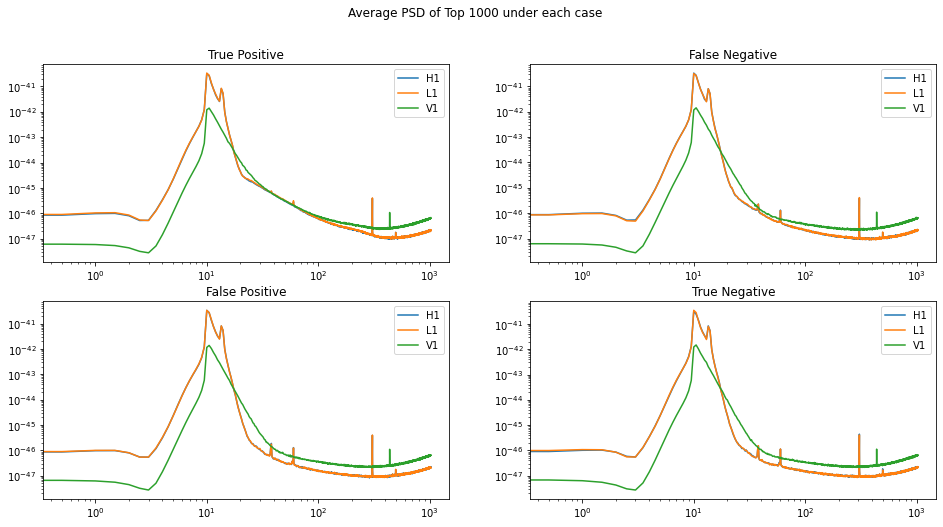

In [77]:
plt.figure(figsize=(16,8))

plt.subplot(2,2,1)
for i in range(3):
    avg_psd = psds_avg_tp_2[i]      
    plt.loglog(sample_freq, avg_psd, label=sites[i])    
plt.title("True Positive")
plt.legend()

plt.subplot(2,2,2)
for i in range(3):
    avg_psd = psds_avg_fn_2[i]      
    plt.loglog(sample_freq, avg_psd, label=sites[i])      
plt.title("False Negative")
plt.legend()

plt.subplot(2,2,3)
for i in range(3):
    avg_psd = psds_avg_fp_2[i]      
    plt.loglog(sample_freq, avg_psd, label=sites[i])      
plt.title("False Positive")
plt.legend()

plt.subplot(2,2,4)
for i in range(3):
    avg_psd = psds_avg_tn_2[i]      
    plt.loglog(sample_freq, avg_psd, label=sites[i])     
plt.title("True Negative")
plt.suptitle(f"Average PSD of Top {sample} under each case")
plt.legend()

In [78]:
sample=1000
psds_avg_t_2 = build_design_curves(train_pos_df.sample(sample))
psds_avg_f_2 = build_design_curves(train_neg_df.sample(sample))

100%|████████████████████████████████████████████████████████████████| 1000/1000 [00:23<00:00, 42.13it/s]


In [60]:
train_pos_df

,id,target,prediction,path
382028,aeba158072,1,1.000000,../kaggle_data//g2net-gravitational-wave-detec...
1813,00cc4321f9,1,0.999998,../kaggle_data//g2net-gravitational-wave-detec...
88489,28377339ba,1,0.999996,../kaggle_data//g2net-gravitational-wave-detec...
270891,7c0d3a5cad,1,0.999995,../kaggle_data//g2net-gravitational-wave-detec...
550842,fbd00a9171,1,0.999993,../kaggle_data//g2net-gravitational-wave-detec...
...,...,...,...,...
147208,4312f53f5e,1,0.000009,../kaggle_data//g2net-gravitational-wave-detec...
71703,2096563183,1,0.000007,../kaggle_data//g2net-gravitational-wave-detec...
527111,f0f75a5701,1,0.000005,../kaggle_data//g2net-gravitational-wave-detec...
354774,a2549225ac,1,0.000004,../kaggle_data//g2net-gravitational-wave-detec...


Text(0.5, 0.98, '(PSD from target 1) / (PSD from target 0)  (averaged over 1000 samples)')

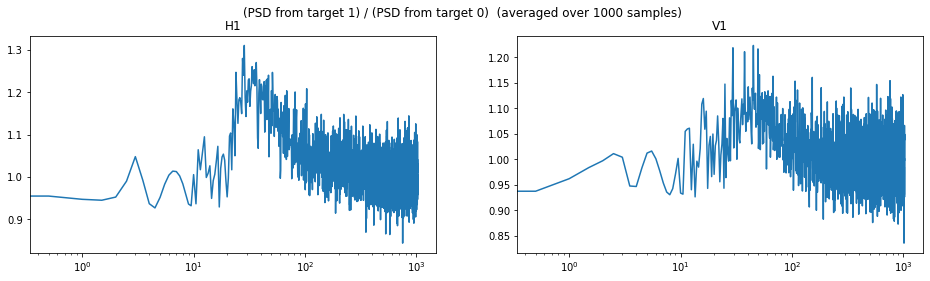

In [81]:
plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
plt.plot(sample_freq, psds_avg_t_2[0]/psds_avg_f_2[0])       
plt.xscale("log")
plt.title("H1")

plt.subplot(1,2,2)
plt.plot(sample_freq, psds_avg_t_2[2]/psds_avg_f_2[2])       
plt.xscale("log")
plt.title("V1")

plt.suptitle(f"(PSD from target 1) / (PSD from target 0)  (averaged over {sample} samples)")

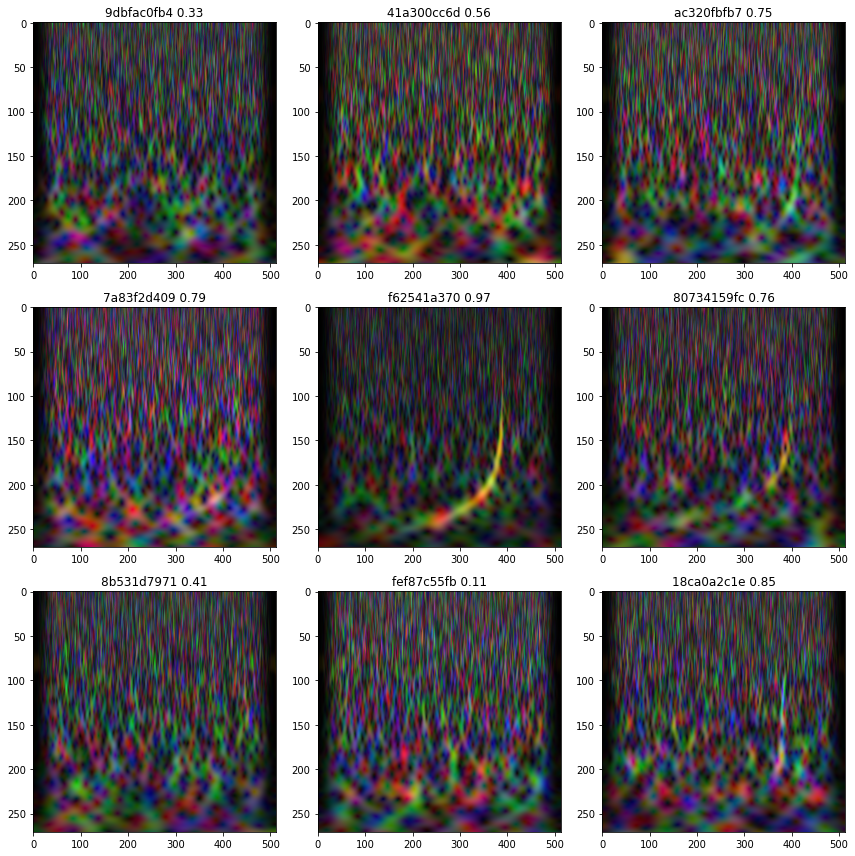

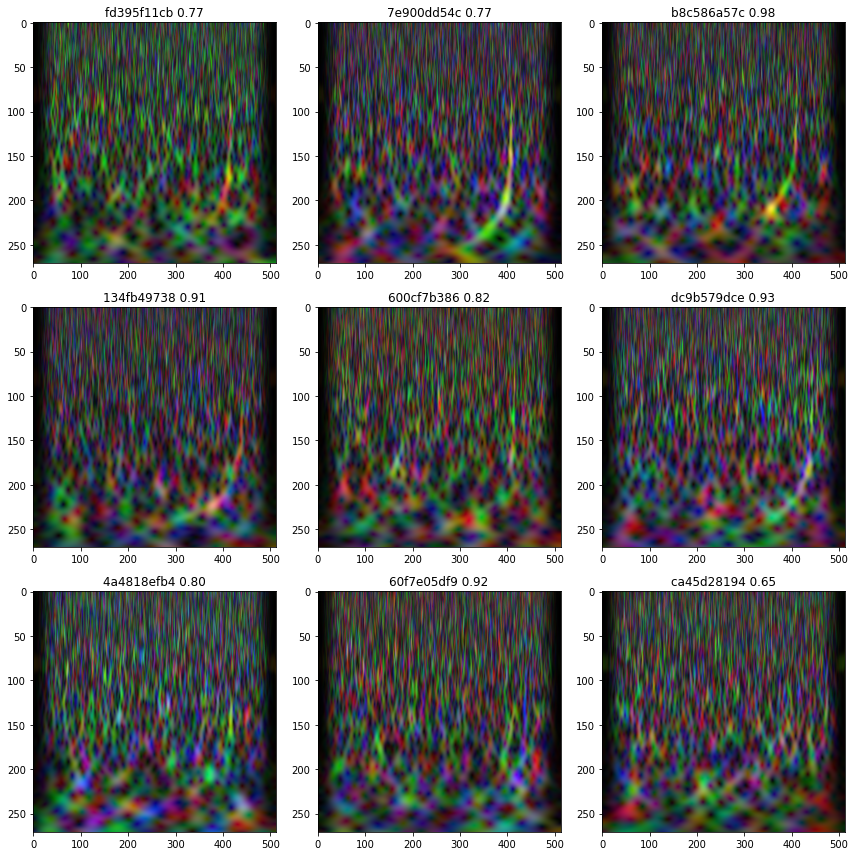

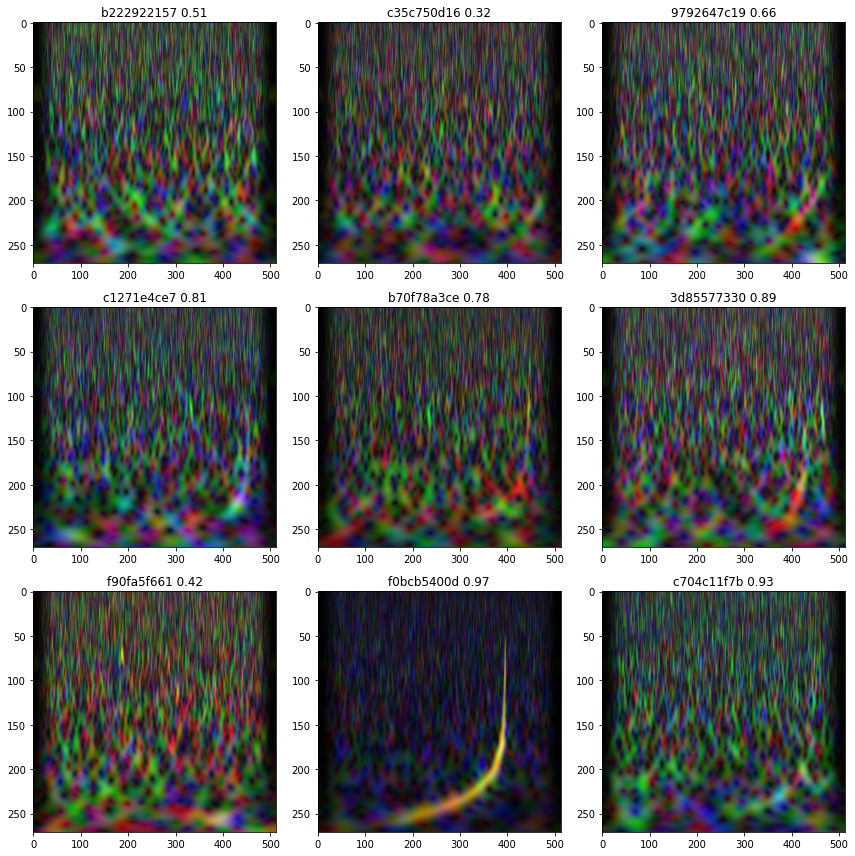

In [339]:
for seed in range(3,6):
    np.random.seed(seed)
    plt.figure(figsize=(12,12))
    for i,idx in enumerate(np.random.choice(range(len(train_pos_df)), size=9, replace=False)):    
        waves = np.load(train_pos_df.iloc[idx,-1])
        idxx = train_pos_df.iloc[idx,0]
        pred_rank = train_pos_df.iloc[idx,-2]
        
        waves_whiten = process_wave_a(waves, asd_dct)
        waves_whiten_image = get_image_a(waves_whiten)
        waves_image_norm = waves_whiten_image - waves_whiten_image.min()
        waves_image_norm = waves_image_norm / waves_image_norm.max()

        plt.subplot(3,3,i+1)
        plt.imshow(np.flipud(waves_image_norm.transpose(1,2,0)),aspect='auto')
        plt.title(f"{idxx} {pred_rank:.2f}")
    plt.tight_layout()
    plt.show()

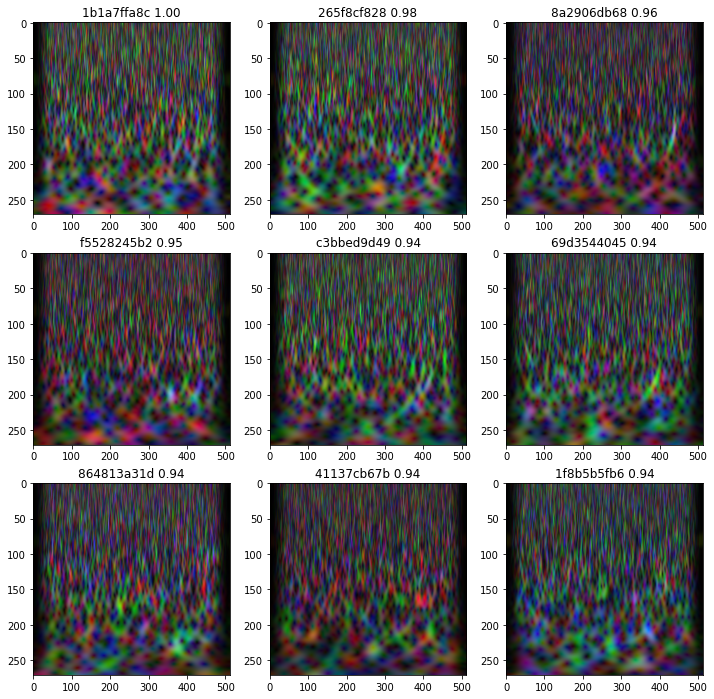

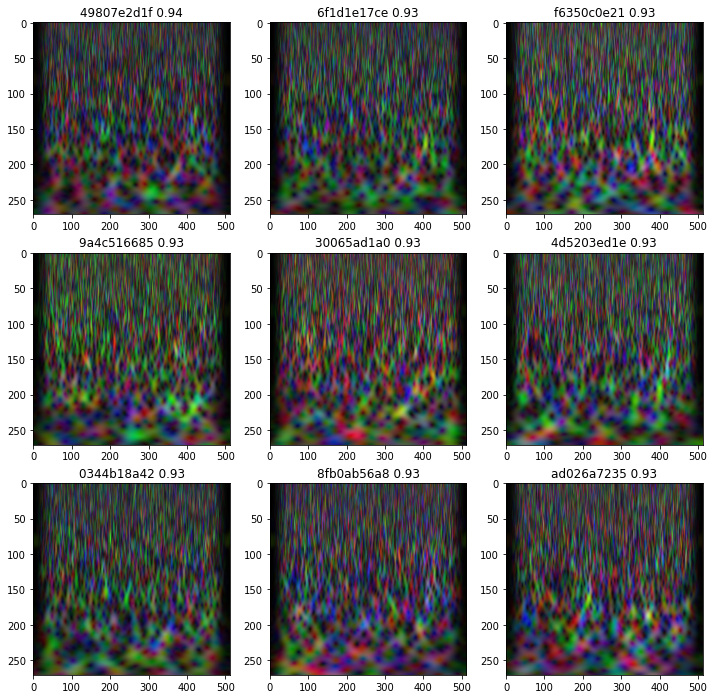

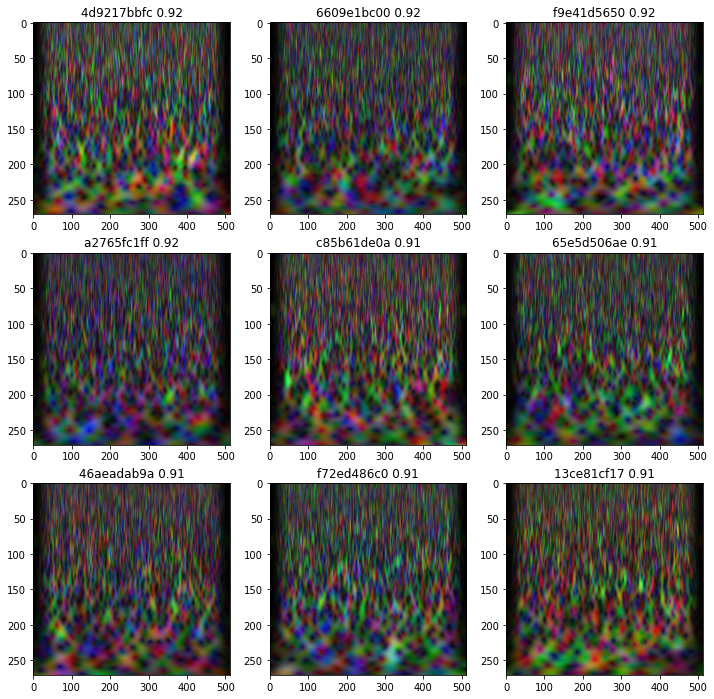

In [340]:
for j in range(3):
    np.random.seed(seed)
    plt.figure(figsize=(12,12))
    for i,idx in enumerate(range(j*9,(j+1)*9)):    
        waves = np.load(train_neg_df.iloc[idx,-1])
        idxx = train_neg_df.iloc[idx,0]
        pred_rank = train_neg_df.iloc[idx,-2]
        waves_whiten = process_wave_a(waves,asd_dct)
        waves_whiten_image = get_image_a(waves_whiten)
        waves_image_norm = waves_whiten_image - waves_whiten_image.min()
        waves_image_norm = waves_image_norm / waves_image_norm.max()

        plt.subplot(3,3,i+1)
        plt.imshow(np.flipud(waves_image_norm.transpose(1,2,0)),aspect='auto')
        plt.title(f"{idxx} {pred_rank:.2f}")
    plt.show()

# Curve From Maxim

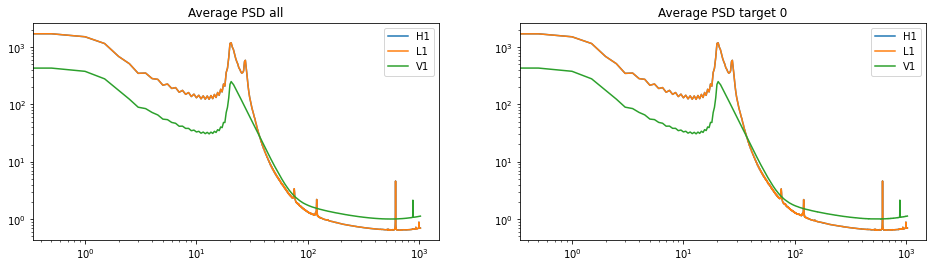

In [117]:
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
for i in range(3):
    avg_psd = AVG_W[i][:2048]
    plt.loglog(sample_freq, avg_psd, label=sites[i])    
plt.title("Average PSD all")
plt.legend()

plt.subplot(1,2,2)
for i in range(3):
    avg_psd = AVG_W0[i][:2048]
    plt.loglog(sample_freq, avg_psd, label=sites[i])    
plt.title("Average PSD target 0")
plt.legend()
plt.show()

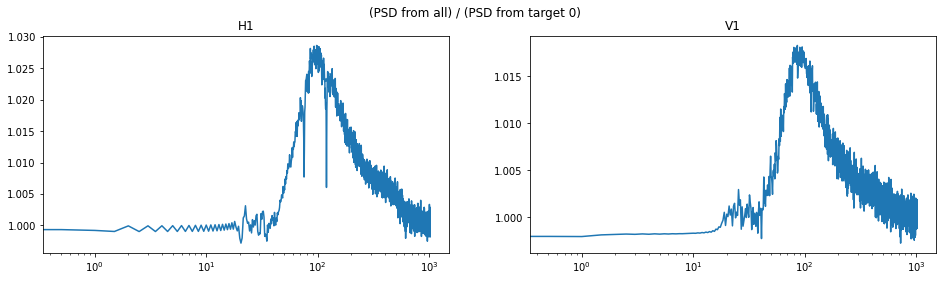

In [119]:
plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
plt.plot(sample_freq, (AVG_W[0]/AVG_W0[0])[:2048])       
plt.xscale("log")
plt.title("H1")

plt.subplot(1,2,2)
plt.plot(sample_freq, (AVG_W[2]/AVG_W0[2])[:2048])       
plt.xscale("log")
plt.title("V1")

plt.suptitle(f"(PSD from all) / (PSD from target 0)")
plt.show()

In [105]:
def get_curve_m(df):
    window = torch.FloatTensor(signal.windows.tukey(4096+2*2048,0.5))
    #window = torch.FloatTensor(signal.windows.tukey(4096,0.2))
    spec = []
    for path in tqdm(df.path):
        waves = np.load(path)
        c = torch.tensor(waves)
        c = torch.cat([-c.flip(-1)[:,4096-2049:-1]+2*c[:,0].unsqueeze(-1),c,
                                   -c.flip(-1)[:,1:2049]+2*c[:,-1].unsqueeze(-1)],1)
        spec.append(torch.fft.fft(c*window).abs())
    spec_avg = torch.stack(spec,0).mean(0)
    return spec_avg
sample = 100
spec_avg = get_curve_m(train_pos_df.sort_values("prediction",ascending=False).iloc[:sample,:].copy())

100%|████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 1393.66it/s]


In [107]:
sample=1000
psds_avg_tp_3 = get_curve_m(train_pos_df.sort_values("prediction",ascending=False).iloc[:sample,:].copy())
psds_avg_fn_3 = get_curve_m(train_pos_df.sort_values("prediction",ascending=True).iloc[:sample,:].copy())
psds_avg_fp_3 = get_curve_m(train_neg_df.sort_values("prediction",ascending=False).iloc[:sample,:].copy())
psds_avg_tn_3 = get_curve_m(train_neg_df.sort_values("prediction",ascending=True).iloc[:sample,:].copy())

100%|██████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 1513.81it/s]


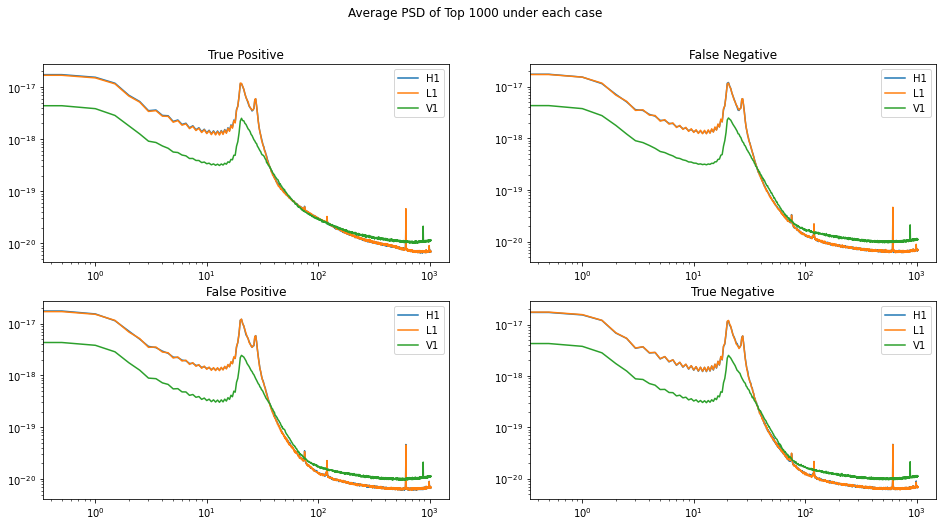

In [108]:
plt.figure(figsize=(16,8))

plt.subplot(2,2,1)
for i in range(3):
    avg_psd = psds_avg_tp_3[i][:2048]
    plt.loglog(sample_freq, avg_psd, label=sites[i])    
plt.title("True Positive")
plt.legend()

plt.subplot(2,2,2)
for i in range(3):
    avg_psd = psds_avg_fn_3[i][:2048]    
    plt.loglog(sample_freq, avg_psd, label=sites[i])      
plt.title("False Negative")
plt.legend()

plt.subplot(2,2,3)
for i in range(3):
    avg_psd = psds_avg_fp_3[i][:2048]   
    plt.loglog(sample_freq, avg_psd, label=sites[i])      
plt.title("False Positive")
plt.legend()

plt.subplot(2,2,4)
for i in range(3):
    avg_psd =  psds_avg_tn_3[i][:2048]   
    plt.loglog(sample_freq, avg_psd, label=sites[i])     
plt.title("True Negative")
plt.suptitle(f"Average PSD of Top {sample} under each case")
plt.legend()

In [109]:
sample=1000
psds_avg_t_3 = get_curve_m(train_pos_df.sample(sample))
psds_avg_f_3 = get_curve_m(train_neg_df.sample(sample))

100%|████████████████████████████████████████████████████████████████| 1000/1000 [00:20<00:00, 48.93it/s]


Text(0.5, 0.98, '(PSD from target 1) / (PSD from target 0)  (averaged over 1000 samples)')

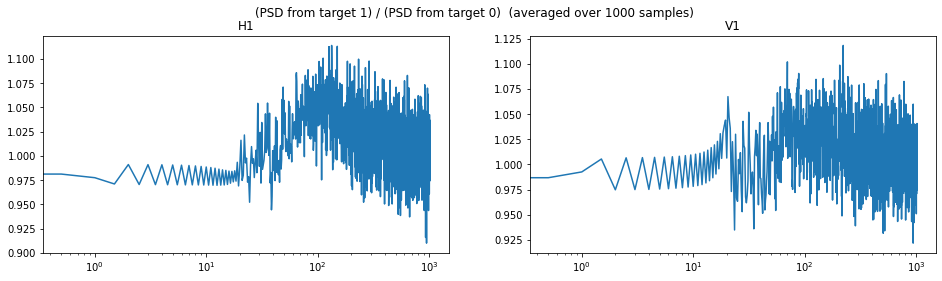

In [110]:
plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
plt.plot(sample_freq, (psds_avg_t_3[0]/psds_avg_f_3[0])[:2048])       
plt.xscale("log")
plt.title("H1")

plt.subplot(1,2,2)
plt.plot(sample_freq, (psds_avg_t_3[2]/psds_avg_f_3[2])[:2048])       
plt.xscale("log")
plt.title("V1")

plt.suptitle(f"(PSD from target 1) / (PSD from target 0)  (averaged over {sample} samples)")

# Sample Analysis

100%|█████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 794.23it/s]


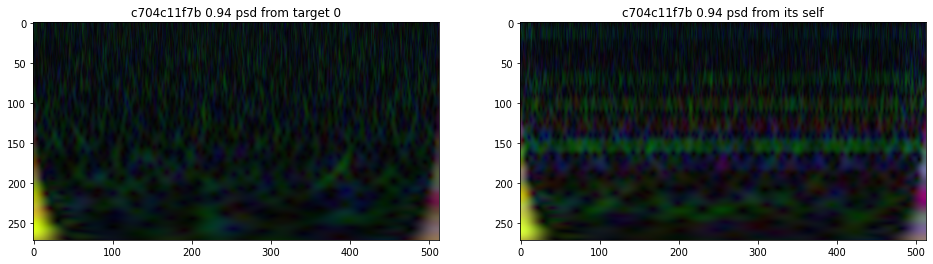

100%|█████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 838.02it/s]


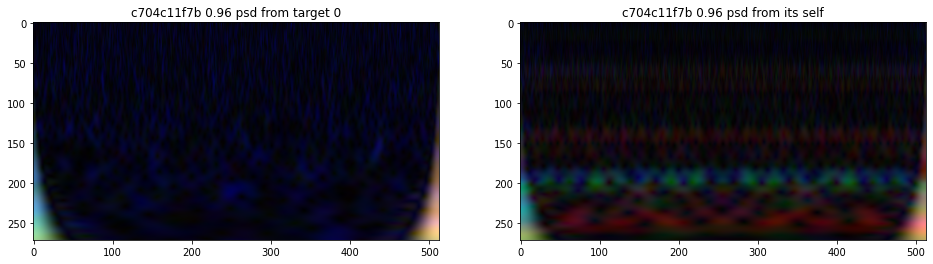

100%|█████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 555.46it/s]


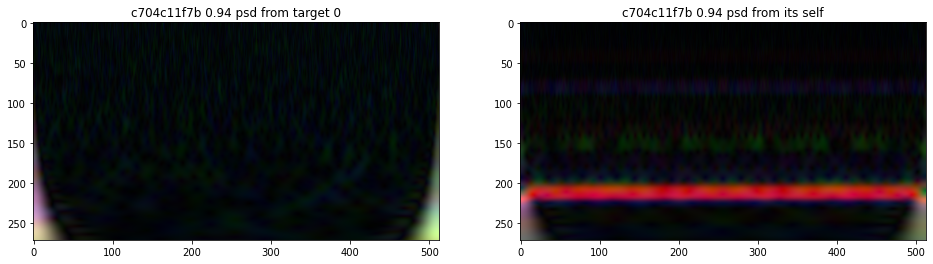

In [200]:
fp_ids = ['69d3544045','8a2906db68','c3bbed9d49']

for idx in fp_ids:
    waves = np.load(train_neg_df.query(f"id == '{idx}'")["path"].iloc[0])
    pred_rank = train_neg_df.query(f"id == '{idx}'")["prediction"].iloc[0]
    
    waves_whiten = process_wave_a(waves, asd_dct)
    waves_whiten_image = get_image_a(waves_whiten)
    waves_image_norm = waves_whiten_image - waves_whiten_image.min()
    waves_image_norm = waves_image_norm / waves_image_norm.max()
    
    plt.figure(figsize=(16,4))
    plt.subplot(1,2,1)
    plt.imshow(np.flipud(waves_image_norm.transpose(1,2,0)),aspect='auto')
    plt.title(f"{idxx} {pred_rank:.2f} psd from target 0")
    
    psd_single = build_design_curves(train_neg_df.query(f"id == '{idx}'"))
    waves_whiten = process_wave_a(waves, psd_single**0.5)
    waves_whiten_image = get_image_a(waves_whiten)
    waves_image_norm = waves_whiten_image - waves_whiten_image.min()
    waves_image_norm = waves_image_norm / waves_image_norm.max()
    
    plt.subplot(1,2,2)
    plt.imshow(np.flipud(waves_image_norm.transpose(1,2,0)),aspect='auto')
    plt.title(f"{idxx} {pred_rank:.2f} psd from its self")

    
    plt.show()
    

## PSD Clustering

In [273]:
import sklearn
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
from sklearn.cluster import DBSCAN

In [173]:
idx_path_dict = dict(zip(train_df["id"],train_df["path"]))
keys = list(idx_path_dict.keys())
len(idx_path_dict)

560000

In [287]:
sample = 10000
psd_H1_dfs = [] 
psd_V1_dfs = []
for idx in tqdm(np.random.choice(keys,size=sample)):
    waves = np.load(idx_path_dict[idx])
    psd_H1 = get_psd(waves[0]*1e20)
    psd_V1 = get_psd(waves[2]*1e20)    
    tmp_psd_H1_df = pd.DataFrame(psd_H1.data, columns=[idx]).T
    tmp_psd_V1_df = pd.DataFrame(psd_V1.data, columns=[idx]).T
    
    psd_H1_dfs.append(tmp_psd_H1_df)
    psd_V1_dfs.append(tmp_psd_V1_df)

100%|██████████████████████████████████████████████████████████████| 10000/10000 [05:04<00:00, 32.79it/s]


In [304]:
psd_H1_df = pd.concat(psd_H1_dfs,axis=0)
psd_V1_df = pd.concat(psd_V1_dfs,axis=0)
psd_H1_df.columns=psd_H1.sample_frequencies
psd_V1_df.columns=psd_V1.sample_frequencies
freqs = psd_H1_df.columns

In [305]:
psd_H1_df.index.name = 'id'
psd_H1_df = psd_H1_df.merge(train_df[["id","target"]], on="id",how="inner").set_index("id",drop=True)
psd_H1_df.rename(columns={"target":"target_label"},inplace=True)
psd_V1_df.index.name = 'id'
psd_V1_df = psd_V1_df.merge(train_df[["id","target"]], on="id",how="inner").set_index("id",drop=True)
psd_V1_df.rename(columns={"target":"target_label"},inplace=True)

In [306]:
freqs_attention = [f for f in freqs if f > 15]

In [308]:
def add_label(method_name, method_class, method_param):
    H1_model = method_class(**method_param)
    H1_model.fit(psd_H1_df[freqs])
    psd_H1_df[method_name + '_label'] = H1_model.labels_

    V1_model = method_class(**method_param)
    V1_model.fit(psd_V1_df[freqs])
    psd_V1_df[method_name + '_label'] = V1_model.labels_
    return
    
def plot_cluster(method_name):
    H1_avg = psd_H1_df.groupby(method_name + "_label")[freqs_attention].mean().T
    V1_avg = psd_V1_df.groupby(method_name + "_label")[freqs_attention].mean().T

    fig, axes = plt.subplots(1,2,figsize=(16,4))
    ax = H1_avg.plot(ax=axes[0])
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_title("H1")
    ax = V1_avg.plot(ax=axes[1])
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_title("V1")
    plt.suptitle(method_name + ': avg psd for each label')
    plt.show()
    
    if len(psd_H1_df[method_name + "_label"].unique()) == 2:
        fig, axes = plt.subplots(1,2,figsize=(16,4))
        H1_diff = H1_avg.loc[:,1]/H1_avg.loc[:,0]
        axes[0].plot(H1_diff.index, H1_diff.values)
        axes[0].set_xscale("log")
        ax.set_title("H1")        
        V1_diff = V1_avg.loc[:,1]/V1_avg.loc[:,0]
        axes[1].plot(V1_diff.index, V1_diff.values)
        axes[1].set_xscale("log")
        ax.set_title("V1")
        plt.suptitle(method_name + ": (avg psd of label 1) / (avg psd of label 0)")
        plt.show()
    return


seed  = 48
kmeans_params = dict(
    n_clusters=2, init='k-means++', n_init=10, max_iter=300, tol=0.0001, 
    verbose=0, random_state=seed, copy_x=True, algorithm='auto'
)
spectral_params = dict(
    n_clusters=2,assign_labels='discretize',random_state=seed, n_jobs=-1
)
dbscan_params = dict(
    eps=0.05, min_samples=100, n_jobs=-1
)

methods_dict = {
    "kmeans": [KMeans, kmeans_params],
#     'spectral':[SpectralClustering, spectral_params],
#     'dbscan':[DBSCAN, dbscan_params]
}

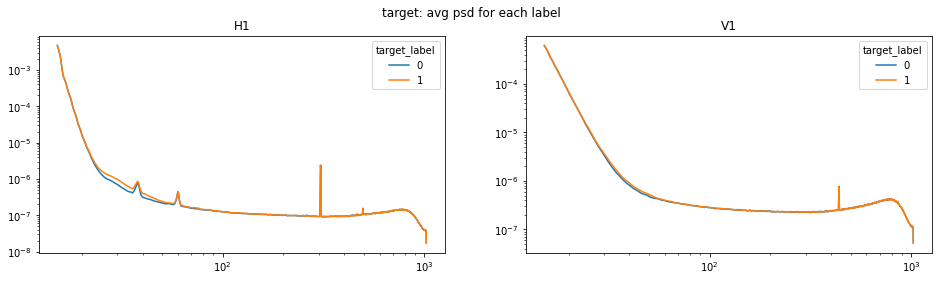

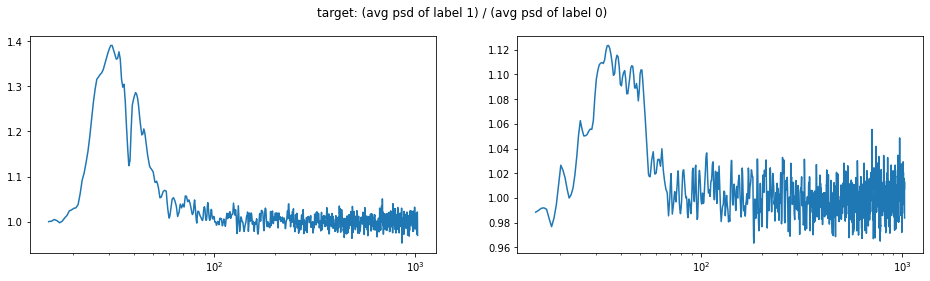

--------------------  KMEANS  ----------------------


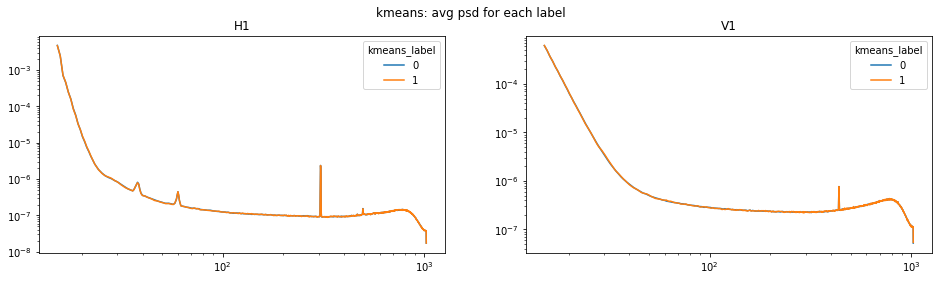

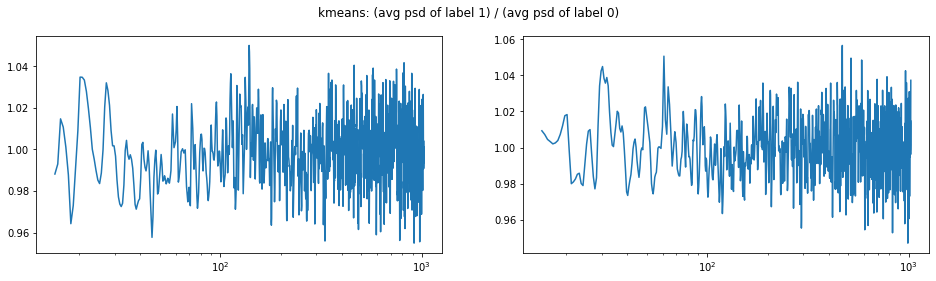

CPU times: user 37 s, sys: 12.3 s, total: 49.3 s
Wall time: 7.89 s


In [309]:
%%time
plot_cluster("target")
for method_name, (method_class, method_param) in methods_dict.items():
    print("-------------------- ", method_name.upper(), " ----------------------")
    add_label(method_name, method_class, method_param)
    plot_cluster(method_name)

# Check PSD after whitening

In [310]:
# psds_avg_tp，psds_avg_fn, psds_avg_fn, psds_avg_tn
#psds_avg_tp_ts = FrequencySeries(psds_avg_tp,delta_f=)

{0: array([6.40095720e-49, 1.09180279e-48, 1.54398356e-48, ...,
        3.69739440e-48, 2.73637210e-48, 1.76062809e-48]),
 1: array([6.58780770e-49, 1.12061971e-48, 1.58281129e-48, ...,
        3.64572207e-48, 2.66422836e-48, 1.66850182e-48]),
 2: array([3.81720074e-50, 6.48043564e-50, 9.14497080e-50, ...,
        1.11924010e-47, 8.24246472e-48, 5.24722709e-48])}

In [318]:
wave.to_frequencyseries().data

array([ 2.37785022e-23+0.00000000e+00j,  2.38367694e-23-1.68029791e-24j,
        2.40131988e-23-3.38053860e-24j, ...,
        5.89522071e-25-4.79817174e-24j, -9.96721004e-25+2.96399429e-24j,
        6.27012161e-25+0.00000000e+00j])

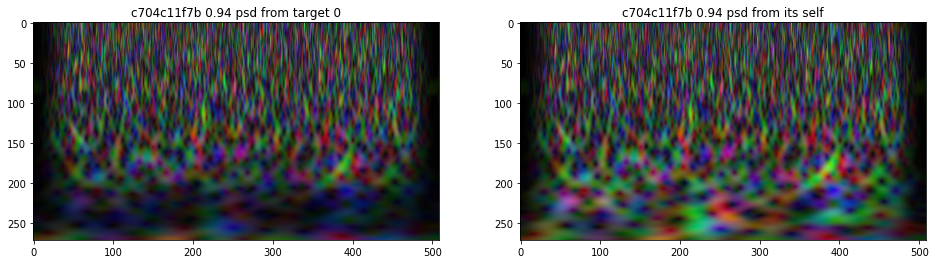

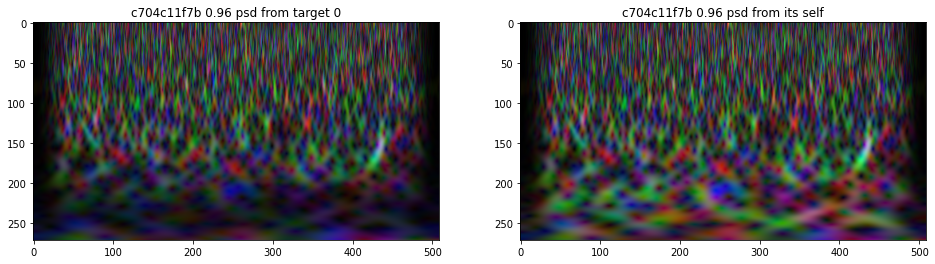

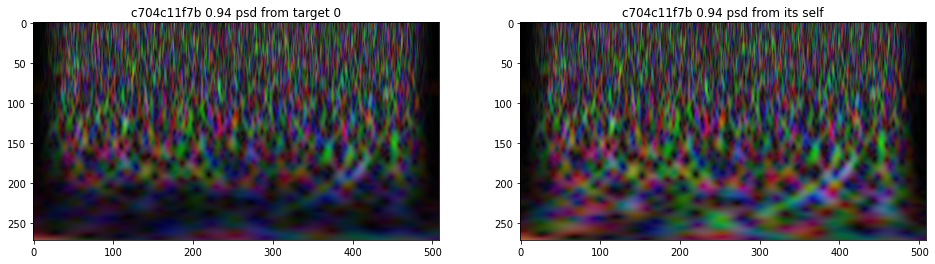

In [322]:
fp_ids = ['69d3544045','8a2906db68','c3bbed9d49']

for idx in fp_ids:
    waves = np.load(train_neg_df.query(f"id == '{idx}'")["path"].iloc[0])
    pred_rank = train_neg_df.query(f"id == '{idx}'")["prediction"].iloc[0]
    
    waves_whiten = []
    for i in range(3):
        wave = TimeSeries(waves[i],delta_t=1/2048)
        wave = wave.highpass_fir(20,8)
        wave = wave.lowpass_fir(950,8)
        wave = wave * signal.windows.tukey(len(wave),alpha=0.2)
        
        wave_whiten = (wave.to_frequencyseries() / psds_avg_tp[i] ** 0.5).to_timeseries()
        waves_whiten.append(wave_whiten)
    waves_whiten = np.array(waves_whiten).astype(np.float32)
    #waves_whiten = process_wave_a(waves, asd_dct)
    waves_whiten_image = get_image_a(waves_whiten)
    waves_image_norm = waves_whiten_image - waves_whiten_image.min()
    waves_image_norm = waves_image_norm / waves_image_norm.max()
    
    plt.figure(figsize=(16,4))
    plt.subplot(1,2,1)
    plt.imshow(np.flipud(waves_image_norm.transpose(1,2,0)),aspect='auto')
    plt.title(f"{idxx} {pred_rank:.2f} psd from target 0")
    
    waves_whiten = []
    for i in range(3):
        wave = TimeSeries(waves[i],delta_t=1/2048)
        wave = wave.highpass_fir(20,8)
        wave = wave.lowpass_fir(950,8)
        wave = wave * signal.windows.tukey(len(wave),alpha=0.2)
        wave_whiten = (wave.to_frequencyseries() / psds_avg_tn[i] ** 0.5).to_timeseries()
        waves_whiten.append(wave_whiten)
        
    waves_whiten = np.array(waves_whiten).astype(np.float32)
    waves_whiten_image = get_image_a(waves_whiten)
    waves_image_norm = waves_whiten_image - waves_whiten_image.min()
    waves_image_norm = waves_image_norm / waves_image_norm.max()
    
    plt.subplot(1,2,2)
    plt.imshow(np.flipud(waves_image_norm.transpose(1,2,0)),aspect='auto')
    plt.title(f"{idxx} {pred_rank:.2f} psd from its self")

    
    plt.show()
    

In [ ]:
fp_ids = ['69d3544045','8a2906db68','c3bbed9d49']

for idx in fp_ids:
    waves = np.load(train_neg_df.query(f"id == '{idx}'")["path"].iloc[0])
    pred_rank = train_neg_df.query(f"id == '{idx}'")["prediction"].iloc[0]
    
    waves_whiten = []
    for i in range(3):
        wave = TimeSeries(waves[i],delta_t=1/2048)
        wave = wave.highpass_fir(20,8)
        wave = wave.lowpass_fir(950,8)
        wave = wave * signal.windows.tukey(len(wave),alpha=0.2)
        
        wave_whiten = (wave.to_frequencyseries() / psds_avg_tp[i] ** 0.5).to_timeseries()
        waves_whiten.append(wave_whiten)
    waves_whiten = np.array(waves_whiten).astype(np.float32)
    #waves_whiten = process_wave_a(waves, asd_dct)
    waves_whiten_image = get_image_a(waves_whiten)
    waves_image_norm = waves_whiten_image - waves_whiten_image.min()
    waves_image_norm = waves_image_norm / waves_image_norm.max()
    
    plt.figure(figsize=(16,4))
    plt.subplot(1,2,1)
    plt.imshow(np.flipud(waves_image_norm.transpose(1,2,0)),aspect='auto')
    plt.title(f"{idxx} {pred_rank:.2f} psd from target 0")
    
    waves_whiten = []
    for i in range(3):
        wave = TimeSeries(waves[i],delta_t=1/2048)
        wave = wave.highpass_fir(20,8)
        wave = wave.lowpass_fir(950,8)
        wave = wave * signal.windows.tukey(len(wave),alpha=0.2)
        wave_whiten = (wave.to_frequencyseries() / psds_avg_tn[i] ** 0.5).to_timeseries()
        waves_whiten.append(wave_whiten)
        
    waves_whiten = np.array(waves_whiten).astype(np.float32)
    waves_whiten_image = get_image_a(waves_whiten)
    waves_image_norm = waves_whiten_image - waves_whiten_image.min()
    waves_image_norm = waves_image_norm / waves_image_norm.max()
    
    plt.subplot(1,2,2)
    plt.imshow(np.flipud(waves_image_norm.transpose(1,2,0)),aspect='auto')
    plt.title(f"{idxx} {pred_rank:.2f} psd from its self")

    
    plt.show()
    

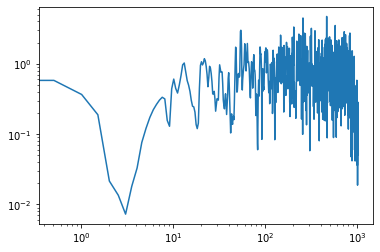

In [328]:
whiten_psd = get_psd(waves_whiten[0])
plt.loglog(whiten_psd.sample_frequencies, whiten_psd) 
plt.show()